<a href="https://colab.research.google.com/github/MatiasHerrneder/bdm-2025/blob/main/TP00.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Intro

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import kagglehub

kagglehub.dataset_download("antimoni/metabolic-syndrome")
csv_file_path = '/kaggle/input/metabolic-syndrome/Metabolic Syndrome.csv'

df = pd.read_csv(csv_file_path)
print("Dimensiones:", df.shape)
display(df.head())

Dimensiones: (2401, 15)


,seqn,Age,Sex,Marital,Income,Race,WaistCirc,BMI,Albuminuria,UrAlbCr,UricAcid,BloodGlucose,HDL,Triglycerides,MetabolicSyndrome
0,62161,22,Male,Single,8200.0,White,81.0,23.3,0,3.88,4.9,92,41,84,0
1,62164,44,Female,Married,4500.0,White,80.1,23.2,0,8.55,4.5,82,28,56,0
2,62169,21,Male,Single,800.0,Asian,69.6,20.1,0,5.07,5.4,107,43,78,0
3,62172,43,Female,Single,2000.0,Black,120.4,33.3,0,5.22,5.0,104,73,141,0
4,62177,51,Male,Married,NaN,Asian,81.1,20.1,0,8.13,5.0,95,43,126,0


In [ ]:
df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2401 entries, 0 to 2400
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   seqn               2401 non-null   int64  
 1   Age                2401 non-null   int64  
 2   Sex                2401 non-null   object 
 3   Marital            2193 non-null   object 
 4   Income             2284 non-null   float64
 5   Race               2401 non-null   object 
 6   WaistCirc          2316 non-null   float64
 7   BMI                2375 non-null   float64
 8   Albuminuria        2401 non-null   int64  
 9   UrAlbCr            2401 non-null   float64
 10  UricAcid           2401 non-null   float64
 11  BloodGlucose       2401 non-null   int64  
 12  HDL                2401 non-null   int64  
 13  Triglycerides      2401 non-null   int64  
 14  MetabolicSyndrome  2401 non-null   int64  
dtypes: float64(5), int64(7), object(3)
memory usage: 281.5+ KB


In [ ]:
df.describe()

,seqn,Age,Income,WaistCirc,BMI,Albuminuria,UrAlbCr,UricAcid,BloodGlucose,HDL,Triglycerides,MetabolicSyndrome
count,2401.000000,2401.000000,2284.000000,2316.000000,2375.000000,2401.000000,2401.000000,2401.000000,2401.000000,2401.000000,2401.000000,2401.000000
mean,67030.674302,48.691795,4005.253940,98.307254,28.702189,0.154102,43.626131,5.489046,108.247813,53.369429,128.125364,0.342357
std,2823.565114,17.632852,2954.032186,16.252634,6.662242,0.422780,258.272829,1.439358,34.820657,15.185537,95.322477,0.474597
min,62161.000000,20.000000,300.000000,56.200000,13.400000,0.000000,1.400000,1.800000,39.000000,14.000000,26.000000,0.000000
25%,64591.000000,34.000000,1600.000000,86.675000,24.000000,0.000000,4.450000,4.500000,92.000000,43.000000,75.000000,0.000000
50%,67059.000000,48.000000,2500.000000,97.000000,27.700000,0.000000,7.070000,5.400000,99.000000,51.000000,103.000000,0.000000
75%,69495.000000,63.000000,6200.000000,107.625000,32.100000,0.000000,13.690000,6.400000,110.000000,62.000000,150.000000,1.000000
max,71915.000000,80.000000,9000.000000,176.000000,68.700000,2.000000,5928.000000,11.300000,382.000000,156.000000,1562.000000,1.000000


In [ ]:
# Valores faltantes (NA)
na_counts = df.isna().sum().sort_values(ascending=False)
display(na_counts.to_frame("NA_count"))

,NA_count
Marital,208
Income,117
WaistCirc,85
BMI,26
Sex,0
seqn,0
Age,0
Race,0
Albuminuria,0
UrAlbCr,0


In [ ]:
num_cols = df.select_dtypes(include=[np.number]).columns.tolist()

means = df[num_cols].mean(numeric_only=True)
medians = df[num_cols].median(numeric_only=True)
modes = df[num_cols].mode(numeric_only=True)
modes = modes.iloc[0] if not modes.empty else pd.Series(index=num_cols, dtype=float)

posicion = pd.DataFrame({
    "mean": means,
    "median": medians,
    "mode": modes.reindex(index=means.index)
})
display(posicion)

# Medias por sexo y especie vs. media global
overall_mean = means.copy()

if "Sex" in df.columns:
    mean_by_sex = df.groupby("Sex")[num_cols].mean(numeric_only=True)
    display(mean_by_sex)
    display(mean_by_sex - overall_mean)

if "Marital" in df.columns:
    mean_by_marital = df.groupby("Marital")[num_cols].mean(numeric_only=True)
    display(mean_by_marital)
    display(mean_by_marital - overall_mean)

if "Race" in df.columns:
    mean_by_race = df.groupby("Race")[num_cols].mean(numeric_only=True)
    display(mean_by_race)
    display(mean_by_race - overall_mean)

,mean,median,mode
seqn,67030.674302,67059.00,62161.0
Age,48.691795,48.00,80.0
Income,4005.253940,2500.00,9000.0
WaistCirc,98.307254,97.00,97.0
BMI,28.702189,27.70,23.3
Albuminuria,0.154102,0.00,0.0
UrAlbCr,43.626131,7.07,5.0
UricAcid,5.489046,5.40,5.2
BloodGlucose,108.247813,99.00,97.0
HDL,53.369429,51.00,48.0


,seqn,Age,Income,WaistCirc,BMI,Albuminuria,UrAlbCr,UricAcid,BloodGlucose,HDL,Triglycerides,MetabolicSyndrome
Sex,,,,,,,,,,,,
Female,67068.974401,48.487201,3916.824849,96.341566,29.040267,0.146160,40.749323,4.908836,105.143683,58.152766,116.009083,0.332783
Male,66991.698319,48.900000,4096.355556,100.286568,28.358659,0.162185,46.553706,6.079496,111.406723,48.501681,140.455462,0.352101


,seqn,Age,Income,WaistCirc,BMI,Albuminuria,UrAlbCr,UricAcid,BloodGlucose,HDL,Triglycerides,MetabolicSyndrome
Sex,,,,,,,,,,,,
Female,38.300099,-0.204594,-88.429091,-1.965688,0.338078,-0.007942,-2.876808,-0.580211,-3.104131,4.783337,-12.116281,-0.009575
Male,-38.975983,0.208205,91.101615,1.979315,-0.343531,0.008082,2.927575,0.590450,3.158909,-4.867749,12.330098,0.009743


,seqn,Age,Income,WaistCirc,BMI,Albuminuria,UrAlbCr,UricAcid,BloodGlucose,HDL,Triglycerides,MetabolicSyndrome
Marital,,,,,,,,,,,,
Divorced,67325.752066,54.830579,2949.557522,101.872532,29.700000,0.194215,48.900083,5.541736,112.838843,53.888430,135.367769,0.400826
Married,67072.257550,52.200503,5066.579178,98.785889,28.565845,0.142617,44.115747,5.571225,108.796980,52.653523,132.973154,0.364933
Separated,67174.810526,49.515789,2575.555556,96.979570,29.027660,0.284211,85.845684,5.329474,106.368421,55.042105,116.705263,0.357895
Single,67053.969880,34.901606,3195.753715,94.909259,28.102028,0.096386,25.408755,5.317269,103.146586,54.321285,108.734940,0.246988
Widowed,66604.734940,70.018072,2631.875000,101.926667,29.492073,0.367470,97.132711,5.681928,117.397590,57.457831,131.843373,0.427711


,seqn,Age,Income,WaistCirc,BMI,Albuminuria,UrAlbCr,UricAcid,BloodGlucose,HDL,Triglycerides,MetabolicSyndrome
Marital,,,,,,,,,,,,
Divorced,295.077764,6.138783,-1055.696418,3.565278,0.997811,0.040112,5.273952,0.052689,4.591030,0.519000,7.242404,0.058469
Married,41.583248,3.508708,1061.325237,0.478635,-0.136344,-0.011485,0.489616,0.082179,0.549166,-0.715906,4.847790,0.022576
Separated,144.136224,0.823994,-1429.698385,-1.327684,0.325470,0.130108,42.219553,-0.159573,-1.879392,1.672676,-11.420101,0.015537
Single,23.295577,-13.790189,-809.500225,-3.397995,-0.600161,-0.057717,-18.217376,-0.171777,-5.101227,0.951856,-19.390425,-0.095369
Widowed,-425.939363,21.326277,-1373.378940,3.619413,0.789884,0.213367,53.506580,0.192881,9.149777,4.088402,3.718009,0.085353


,seqn,Age,Income,WaistCirc,BMI,Albuminuria,UrAlbCr,UricAcid,BloodGlucose,HDL,Triglycerides,MetabolicSyndrome
Race,,,,,,,,,,,,
Asian,66859.601719,45.197708,4918.238994,87.335312,24.352464,0.117479,29.328825,5.432951,104.699140,54.401146,127.312321,0.232092
Black,67072.602190,48.594891,3779.768786,100.531179,30.517897,0.191606,72.795347,5.594708,111.171533,56.583942,100.808394,0.330292
Hispanic,67103.918288,49.988327,3391.452991,98.346371,29.019216,0.159533,32.179961,5.300389,109.003891,50.451362,134.898833,0.400778
MexAmerican,67182.786561,44.723320,3316.599190,100.764082,30.055823,0.193676,63.092648,5.221344,113.316206,49.980237,144.936759,0.407115
Other,67098.885246,43.590164,3412.068966,96.823729,28.473770,0.180328,22.022787,5.295082,111.262295,53.737705,112.639344,0.278689
White,67004.156484,51.108253,4197.797357,100.531077,28.824160,0.131833,31.128242,5.585209,106.078242,52.794212,139.062165,0.361200


,seqn,Age,Income,WaistCirc,BMI,Albuminuria,UrAlbCr,UricAcid,BloodGlucose,HDL,Triglycerides,MetabolicSyndrome
Race,,,,,,,,,,,,
Asian,-171.072583,-3.494087,912.985053,-10.971942,-4.349726,-0.036624,-14.297306,-0.056095,-3.548673,1.031717,-0.813044,-0.110266
Black,41.927887,-0.096905,-225.485154,2.223925,1.815707,0.037503,29.169216,0.105662,2.923719,3.214512,-27.316970,-0.012065
Hispanic,73.243986,1.296532,-613.800949,0.039117,0.317026,0.005431,-11.446170,-0.188657,0.756078,-2.918068,6.773468,0.058421
MexAmerican,152.112259,-3.968475,-688.654750,2.456828,1.353634,0.039573,19.466517,-0.267702,5.068392,-3.389192,16.811394,0.064757
Other,68.210944,-5.101631,-593.184975,-1.483525,-0.228419,0.026225,-21.603344,-0.193964,3.014482,0.368276,-15.486020,-0.063669
White,-26.517818,2.416458,192.543416,2.223823,0.121971,-0.022270,-12.497889,0.096163,-2.169571,-0.575217,10.936801,0.018843


In [ ]:
stds = df[num_cols].std(numeric_only=True)
vars_ = df[num_cols].var(numeric_only=True)
iqr = df[num_cols].quantile(0.75) - df[num_cols].quantile(0.25)

dispersion = pd.DataFrame({"std": stds, "var": vars_, "IQR": iqr})
display(dispersion)

,std,var,IQR
seqn,2823.565114,7.972520e+06,4904.00
Age,17.632852,3.109175e+02,29.00
Income,2954.032186,8.726306e+06,4600.00
WaistCirc,16.252634,2.641481e+02,20.95
BMI,6.662242,4.438547e+01,8.10
Albuminuria,0.422780,1.787425e-01,0.00
UrAlbCr,258.272829,6.670485e+04,9.24
UricAcid,1.439358,2.071751e+00,1.90
BloodGlucose,34.820657,1.212478e+03,18.00
HDL,15.185537,2.306005e+02,19.00


<Axes: >

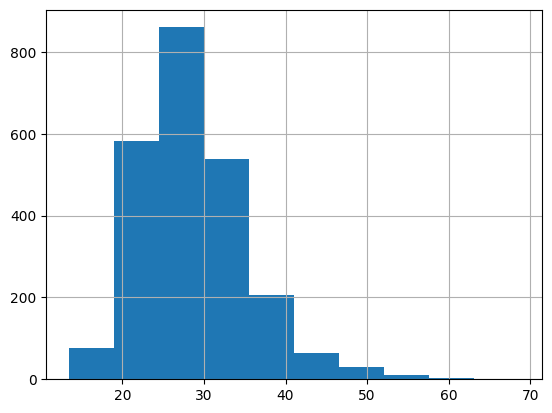

In [ ]:
# histograma
df['BMI'].hist()

<Axes: >

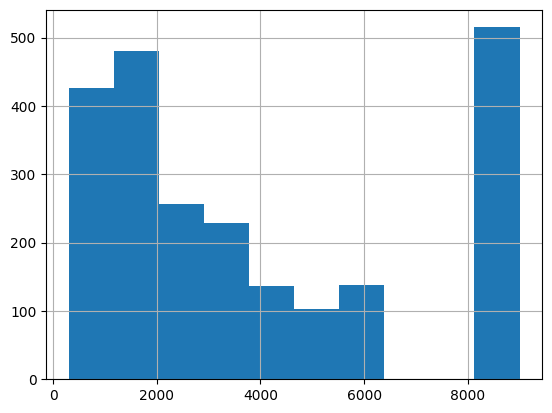

In [ ]:
df['Income'].hist()

<Axes: xlabel='Race'>

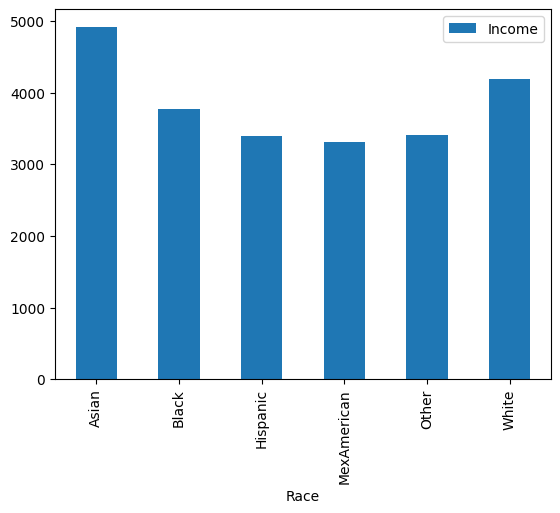

In [ ]:
df[["Race", "Income"]].groupby('Race').mean().plot.bar(y="Income")

<Axes: title={'center': 'BMI'}, xlabel='[Race]'>

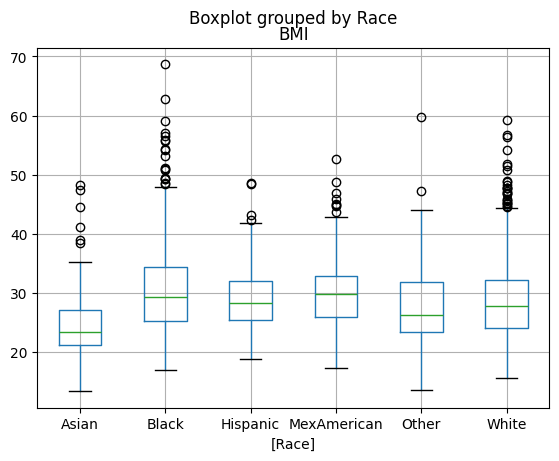

In [ ]:
df[["Race", "BMI"]].boxplot(by="Race")

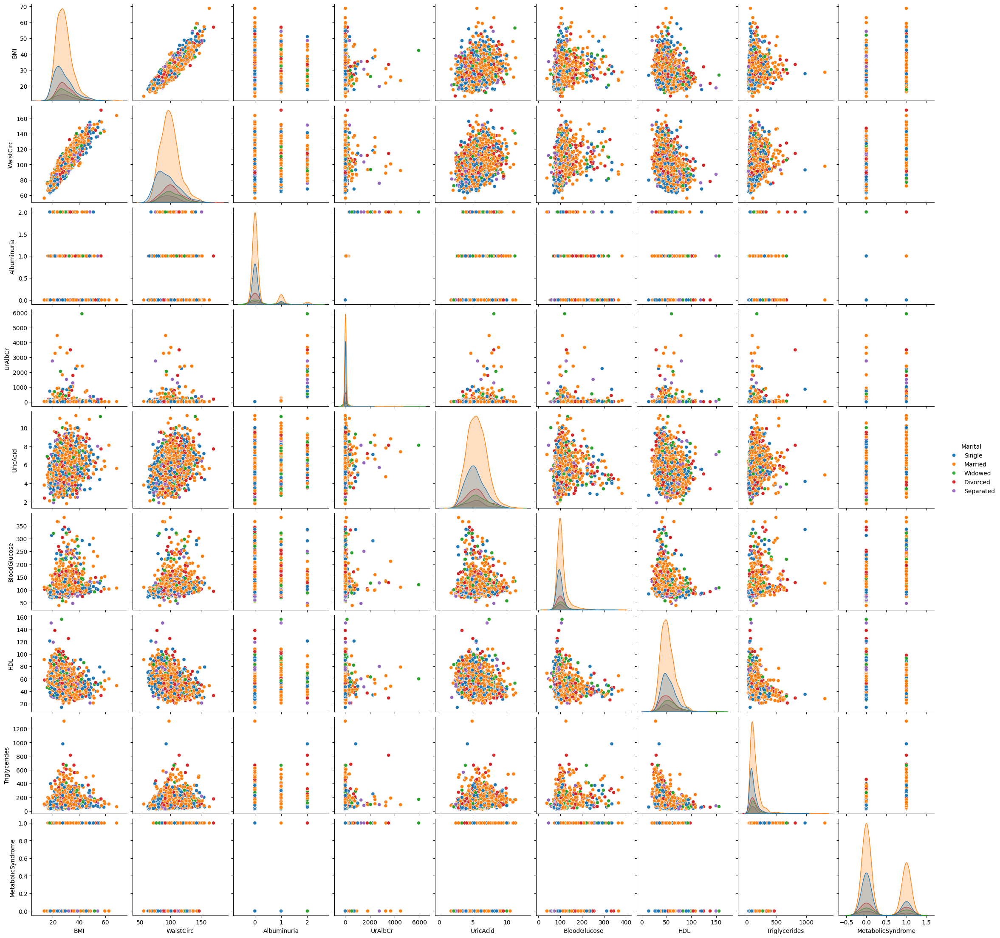

In [ ]:
import seaborn as sns

sns.pairplot(data = df, vars=['BMI', 'WaistCirc','Albuminuria','UrAlbCr','UricAcid','BloodGlucose','HDL', 'Triglycerides', 'MetabolicSyndrome'] , hue="Marital")
plt.show()


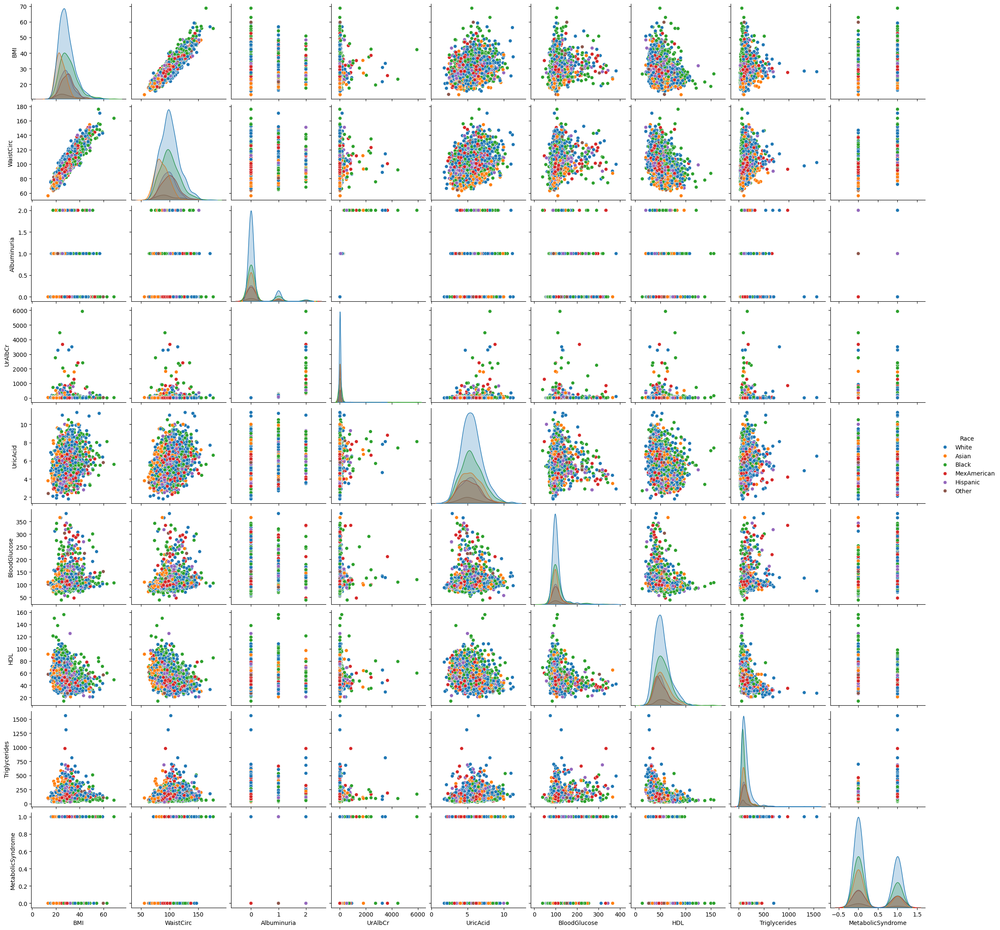

In [ ]:
import seaborn as sns

sns.pairplot(data = df, vars=['BMI', 'WaistCirc','Albuminuria','UrAlbCr','UricAcid','BloodGlucose','HDL', 'Triglycerides', 'MetabolicSyndrome'] , hue="Race")
plt.show()


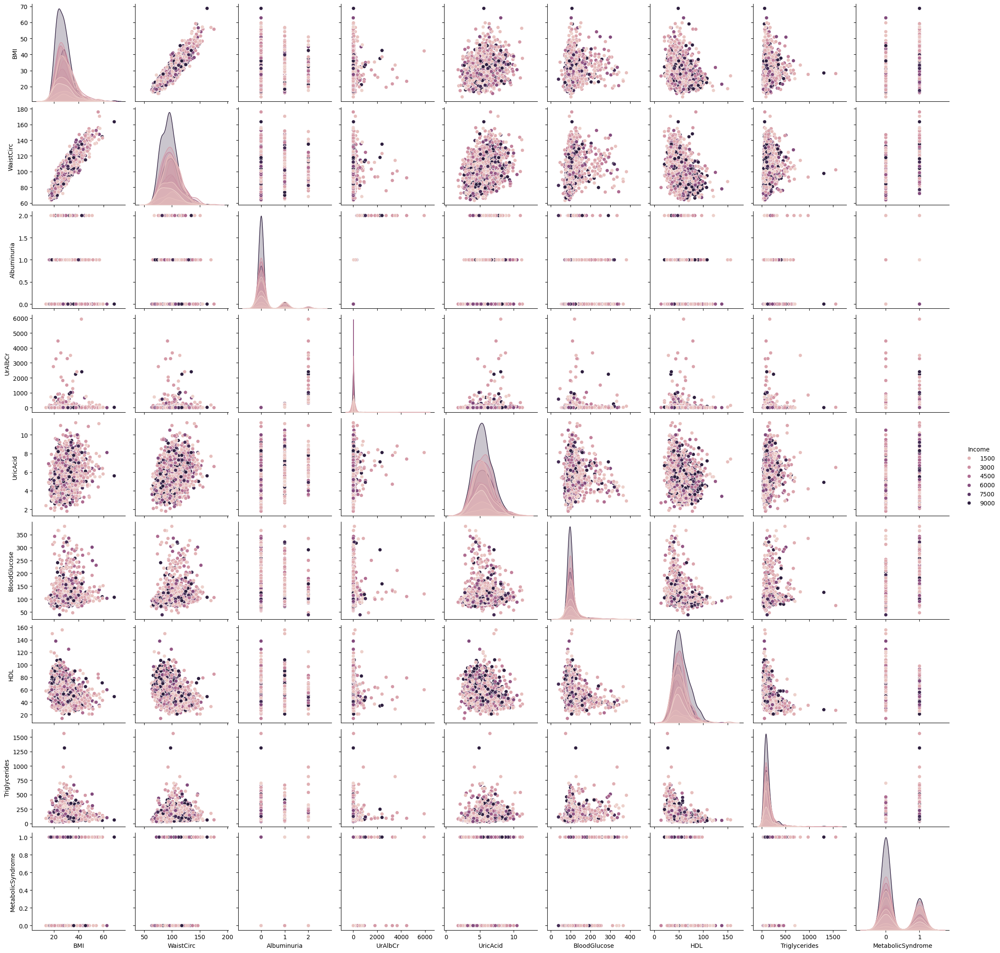

In [ ]:
import seaborn as sns

sns.pairplot(data = df, vars=['BMI', 'WaistCirc','Albuminuria','UrAlbCr','UricAcid','BloodGlucose','HDL', 'Triglycerides', 'MetabolicSyndrome'] , hue="Income")
plt.show()


In [ ]:
df_sorted_by_bmi = df.sort_values(by='BMI', ascending=False)
display(df_sorted_by_bmi.head())

,seqn,Age,Sex,Marital,Income,Race,WaistCirc,BMI,Albuminuria,UrAlbCr,UricAcid,BloodGlucose,HDL,Triglycerides,MetabolicSyndrome
169,62849,40,Female,Married,9000.0,Black,163.5,68.7,0,20.69,5.6,107,49,61,1
1490,68256,46,Female,Married,6200.0,Black,NaN,62.8,0,2.90,8.1,103,60,101,0
2396,71901,48,Female,Married,1000.0,Other,NaN,59.7,0,22.11,5.8,152,57,107,0
1153,66873,54,Female,Married,1700.0,White,142.8,59.2,0,9.65,6.4,103,43,139,1
507,64161,51,Female,Single,9000.0,Black,144.4,59.0,0,13.49,6.4,109,71,55,1


,seqn,Age,Income,WaistCirc,BMI,Albuminuria,UrAlbCr,UricAcid,BloodGlucose,HDL,Triglycerides,MetabolicSyndrome
seqn,1.000000,0.009319,0.019393,-0.011310,-0.003498,-0.022789,-0.022108,0.022535,-0.039058,0.056168,0.019063,0.011364
Age,0.009319,1.000000,-0.011982,0.226470,0.079916,0.233464,0.118380,0.147928,0.236610,0.079368,0.069885,0.248618
Income,0.019393,-0.011982,1.000000,-0.063519,-0.081061,-0.100098,-0.048996,0.007967,-0.093311,0.077549,-0.039772,-0.083706
WaistCirc,-0.011310,0.226470,-0.063519,1.000000,0.908751,0.121825,0.047630,0.355836,0.261579,-0.352481,0.236098,0.497479
BMI,-0.003498,0.079916,-0.081061,0.908751,1.000000,0.077088,0.038740,0.272089,0.209645,-0.292905,0.163758,0.430825
Albuminuria,-0.022789,0.233464,-0.100098,0.121825,0.077088,1.000000,0.536214,0.176760,0.198642,-0.024188,0.107842,0.158501
UrAlbCr,-0.022108,0.118380,-0.048996,0.047630,0.038740,0.536214,1.000000,0.130928,0.106458,0.001667,0.077873,0.085168
UricAcid,0.022535,0.147928,0.007967,0.355836,0.272089,0.176760,0.130928,1.000000,0.055943,-0.252587,0.207328,0.246423
BloodGlucose,-0.039058,0.236610,-0.093311,0.261579,0.209645,0.198642,0.106458,0.055943,1.000000,-0.213905,0.269506,0.362219
HDL,0.056168,0.079368,0.077549,-0.352481,-0.292905,-0.024188,0.001667,-0.252587,-0.213905,1.000000,-0.388487,-0.371378


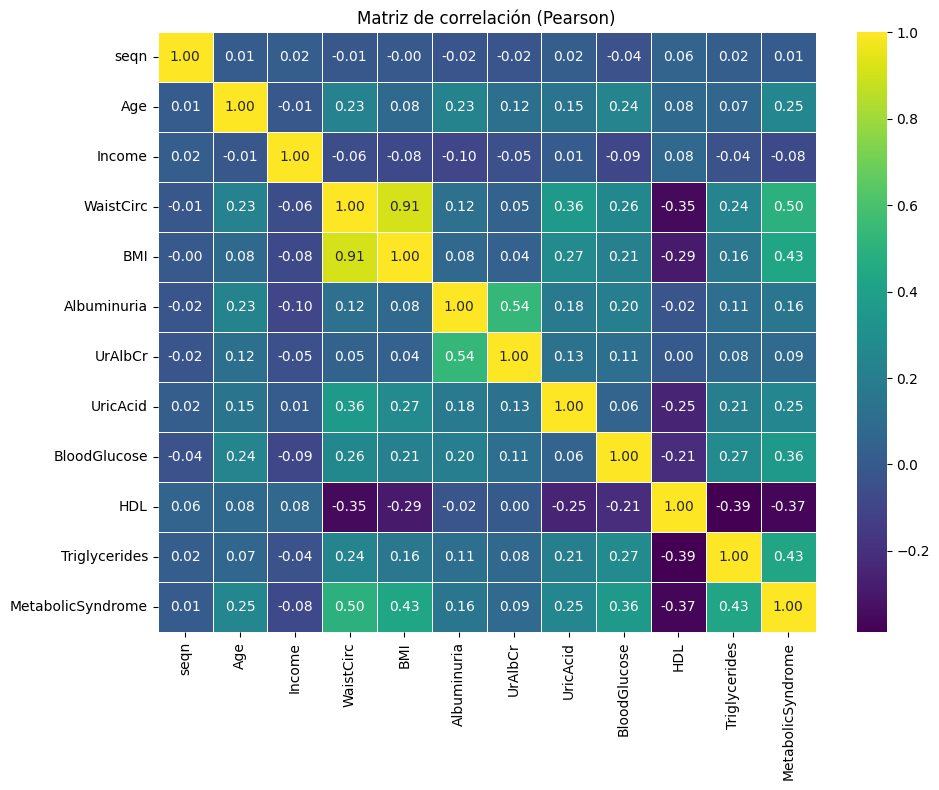

In [ ]:
corr = df.select_dtypes(include=[np.number]).corr()
display(corr)

plt.figure(figsize=(10, 8)) # Increased figure size for better readability
sns.heatmap(corr, annot=True, cmap='viridis', fmt=".2f", linewidths=.5) # Added heatmap with annotations and colormap
plt.xticks(ticks=np.arange(len(corr.columns)) + 0.5, labels=corr.columns, rotation=90)
plt.yticks(ticks=np.arange(len(corr.columns)) + 0.5, labels=corr.columns)
plt.title("Matriz de correlación (Pearson)")
plt.tight_layout()
plt.show()

# **PUNTO 2**


In [ ]:
num_cols = df.select_dtypes(include=[np.number]).columns.tolist()
cat_cols = df.select_dtypes(include='object').columns.tolist()

# Calculate overall metrics
means = df[num_cols].mean(numeric_only=True)
medians = df[num_cols].median(numeric_only=True)
modes = df[num_cols].mode(numeric_only=True)
modes = modes.iloc[0] if not modes.empty else pd.Series(index=num_cols, dtype=float)
stds = df[num_cols].std(numeric_only=True)
vars_ = df[num_cols].var(numeric_only=True)
iqr = df[num_cols].quantile(0.75) - df[num_cols].quantile(0.25)

posicion_dispersion = pd.DataFrame({
    "mean": means,
    "median": medians,
    "mode": modes.reindex(index=means.index),
    "std": stds,
    "var": vars_,
    "IQR": iqr
})
print("Overall Metrics:")
display(posicion_dispersion)

# Calculate metrics by categorical variables
for cat_col in cat_cols:
    if cat_col in df.columns:
        print(f"\nMetrics by {cat_col}:")
        mean_by_cat = df.groupby(cat_col)[num_cols].mean(numeric_only=True)
        median_by_cat = df.groupby(cat_col)[num_cols].median(numeric_only=True)
        std_by_cat = df.groupby(cat_col)[num_cols].std(numeric_only=True)
        var_by_cat = df.groupby(cat_col)[num_cols].var(numeric_only=True)
        # Mode and IQR are a bit trickier to compute directly with groupby in this format
        # We'll display mean, median, std, and var for grouped data
        cat_metrics = pd.concat([mean_by_cat.add_suffix('_mean'),
                                 median_by_cat.add_suffix('_median'),
                                 std_by_cat.add_suffix('_std'),
                                 var_by_cat.add_suffix('_var')], axis=1)
        display(cat_metrics)

Overall Metrics:


,mean,median,mode,std,var,IQR
seqn,67030.674302,67059.00,62161.0,2823.565114,7.972520e+06,4904.00
Age,48.691795,48.00,80.0,17.632852,3.109175e+02,29.00
Income,4005.253940,2500.00,9000.0,2954.032186,8.726306e+06,4600.00
WaistCirc,98.307254,97.00,97.0,16.252634,2.641481e+02,20.95
BMI,28.702189,27.70,23.3,6.662242,4.438547e+01,8.10
Albuminuria,0.154102,0.00,0.0,0.422780,1.787425e-01,0.00
UrAlbCr,43.626131,7.07,5.0,258.272829,6.670485e+04,9.24
UricAcid,5.489046,5.40,5.2,1.439358,2.071751e+00,1.90
BloodGlucose,108.247813,99.00,97.0,34.820657,1.212478e+03,18.00
HDL,53.369429,51.00,48.0,15.185537,2.306005e+02,19.00



Metrics by Sex:


,seqn_mean,Age_mean,Income_mean,WaistCirc_mean,BMI_mean,Albuminuria_mean,UrAlbCr_mean,UricAcid_mean,BloodGlucose_mean,HDL_mean,...,Income_var,WaistCirc_var,BMI_var,Albuminuria_var,UrAlbCr_var,UricAcid_var,BloodGlucose_var,HDL_var,Triglycerides_var,MetabolicSyndrome_var
Sex,,,,,,,,,,,,,,,,,,,,,
Female,67068.974401,48.487201,3916.824849,96.341566,29.040267,0.146160,40.749323,4.908836,105.143683,58.152766,...,8.663922e+06,272.399985,53.637073,0.162917,60821.829150,1.82360,1061.723140,233.575817,6696.047025,0.222222
Male,66991.698319,48.900000,4096.355556,100.286568,28.358659,0.162185,46.553706,6.079496,111.406723,48.501681,...,8.781971e+06,248.252924,34.787882,0.194868,72730.879118,1.63423,1347.114505,180.748105,11224.882371,0.228318



Metrics by Marital:


,seqn_mean,Age_mean,Income_mean,WaistCirc_mean,BMI_mean,Albuminuria_mean,UrAlbCr_mean,UricAcid_mean,BloodGlucose_mean,HDL_mean,...,Income_var,WaistCirc_var,BMI_var,Albuminuria_var,UrAlbCr_var,UricAcid_var,BloodGlucose_var,HDL_var,Triglycerides_var,MetabolicSyndrome_var
Marital,,,,,,,,,,,,,,,,,,,,,
Divorced,67325.752066,54.830579,2949.557522,101.872532,29.700000,0.194215,48.900083,5.541736,112.838843,53.888430,...,5.635755e+06,265.737518,42.231513,0.215236,69093.407708,2.252317,1712.052759,296.240612,12135.113148,0.241161
Married,67072.257550,52.200503,5066.579178,98.785889,28.565845,0.142617,44.115747,5.571225,108.796980,52.653523,...,8.925852e+06,236.597586,40.641315,0.169400,68950.867472,2.040238,1010.250940,204.785815,8415.962335,0.231951
Separated,67174.810526,49.515789,2575.555556,96.979570,29.027660,0.284211,85.845684,5.329474,106.368421,55.042105,...,4.765463e+06,207.493817,43.145033,0.290705,118039.353099,2.268909,989.873460,333.806719,5583.699440,0.232251
Single,67053.969880,34.901606,3195.753715,94.909259,28.102028,0.096386,25.408755,5.317269,103.146586,54.321285,...,7.493939e+06,334.679440,55.056175,0.115440,16647.374636,1.955798,1079.316497,216.097775,5666.710286,0.186359
Widowed,66604.734940,70.018072,2631.875000,101.926667,29.492073,0.367470,97.132711,5.681928,117.397590,57.457831,...,5.884575e+06,220.001029,41.257176,0.367178,244884.320563,2.373126,1875.937934,279.389120,6251.854107,0.246258



Metrics by Race:


,seqn_mean,Age_mean,Income_mean,WaistCirc_mean,BMI_mean,Albuminuria_mean,UrAlbCr_mean,UricAcid_mean,BloodGlucose_mean,HDL_mean,...,Income_var,WaistCirc_var,BMI_var,Albuminuria_var,UrAlbCr_var,UricAcid_var,BloodGlucose_var,HDL_var,Triglycerides_var,MetabolicSyndrome_var
Race,,,,,,,,,,,,,,,,,,,,,
Asian,66859.601719,45.197708,4918.238994,87.335312,24.352464,0.117479,29.328825,5.432951,104.699140,54.401146,...,9.942758e+06,169.376993,21.713606,0.138458,21442.185930,2.001584,696.917844,209.683447,6841.703899,0.178737
Black,67072.602190,48.594891,3779.768786,100.531179,30.517897,0.191606,72.795347,5.594708,111.171533,56.583942,...,8.541308e+06,284.993274,56.389790,0.224646,162097.449419,2.156882,1675.012570,284.378681,4197.383695,0.221604
Hispanic,67103.918288,49.988327,3391.452991,98.346371,29.019216,0.159533,32.179961,5.300389,109.003891,50.451362,...,6.569798e+06,171.398124,26.999984,0.212731,11745.183685,1.898945,1227.199204,166.904852,7579.083475,0.241093
MexAmerican,67182.786561,44.723320,3316.599190,100.764082,30.055823,0.193676,63.092648,5.221344,113.316206,49.980237,...,6.118788e+06,220.613623,34.493282,0.228214,92152.922708,1.790892,1744.796443,165.305163,11681.591223,0.242330
Other,67098.885246,43.590164,3412.068966,96.823729,28.473770,0.180328,22.022787,5.295082,111.262295,53.737705,...,7.921080e+06,312.259082,64.275634,0.183607,2642.017014,1.957475,1402.196721,188.996721,4513.534426,0.204372
White,67004.156484,51.108253,4197.797357,100.531077,28.824160,0.131833,31.128242,5.585209,106.078242,52.794212,...,9.159422e+06,268.287855,42.638602,0.142473,39413.404208,2.141133,957.653743,233.633572,12185.534758,0.230982


In [ ]:
num_cols = df.select_dtypes(include=[np.number]).columns.tolist()

means = df[num_cols].mean(numeric_only=True)
medians = df[num_cols].median(numeric_only=True)
modes = df[num_cols].mode(numeric_only=True)
modes = modes.iloc[0] if not modes.empty else pd.Series(index=num_cols, dtype=float)

posicion = pd.DataFrame({
    "mean": means,
    "median": medians,
    "mode": modes.reindex(index=means.index)
})
display(posicion)

,mean,median,mode
seqn,67030.674302,67059.00,62161.0
Age,48.691795,48.00,80.0
Income,4005.253940,2500.00,9000.0
WaistCirc,98.307254,97.00,97.0
BMI,28.702189,27.70,23.3
Albuminuria,0.154102,0.00,0.0
UrAlbCr,43.626131,7.07,5.0
UricAcid,5.489046,5.40,5.2
BloodGlucose,108.247813,99.00,97.0
HDL,53.369429,51.00,48.0


# **Punto 3**

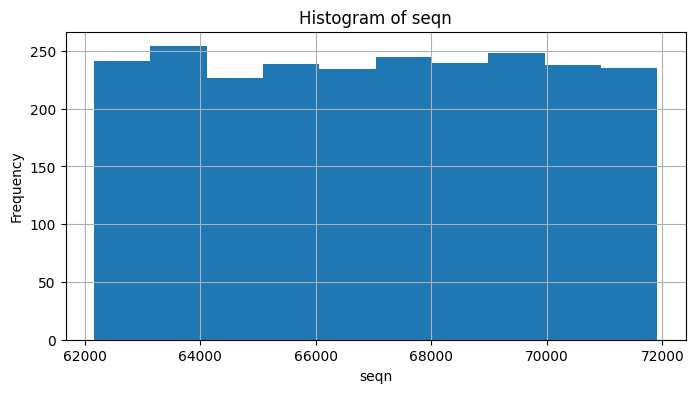

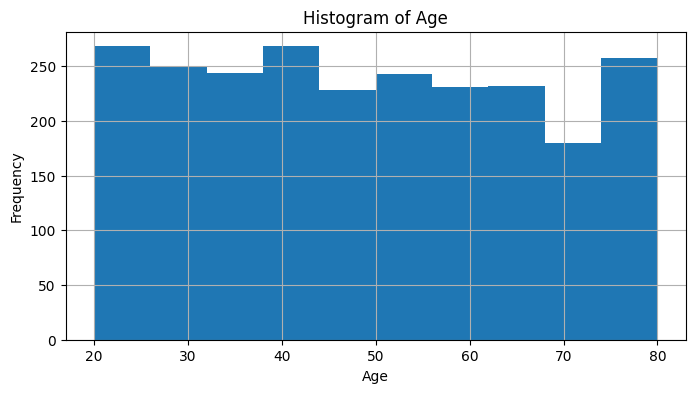

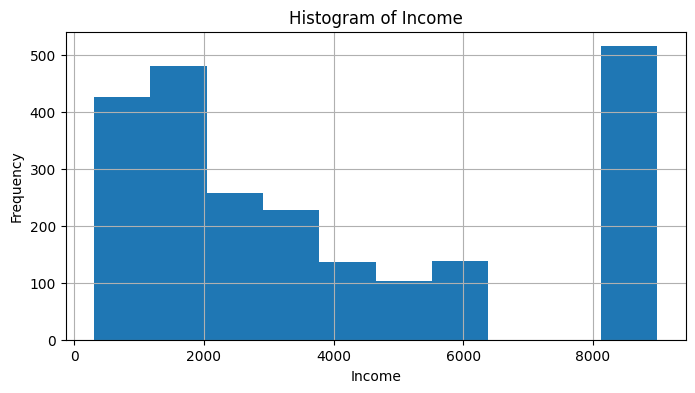

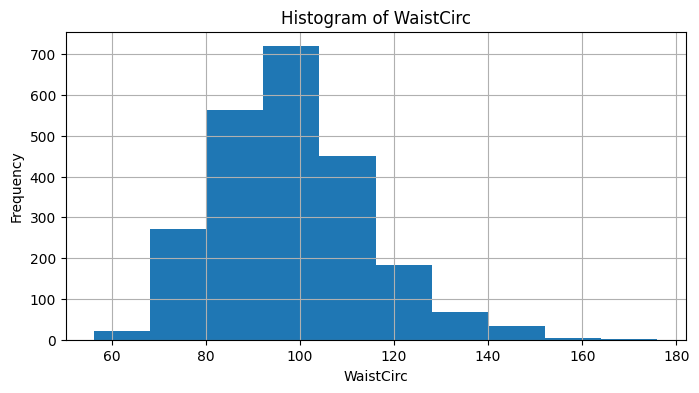

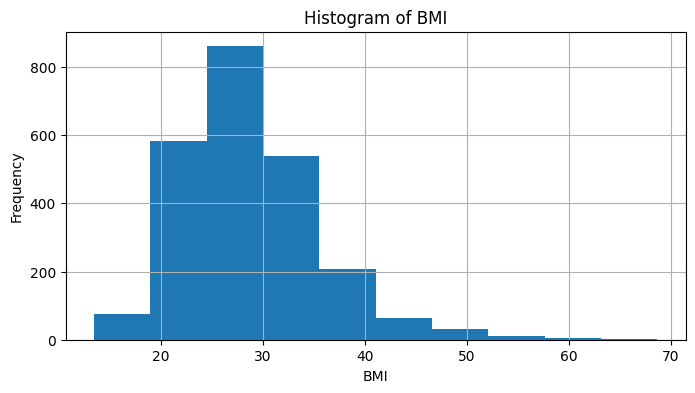

...

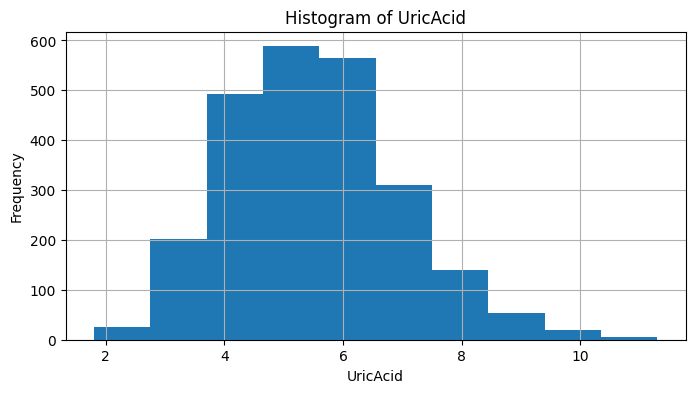

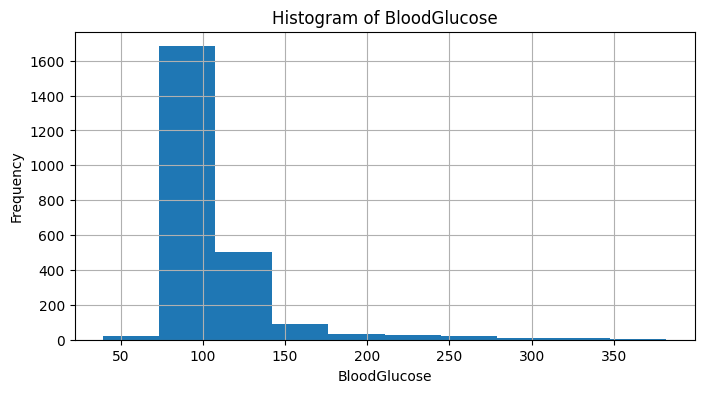

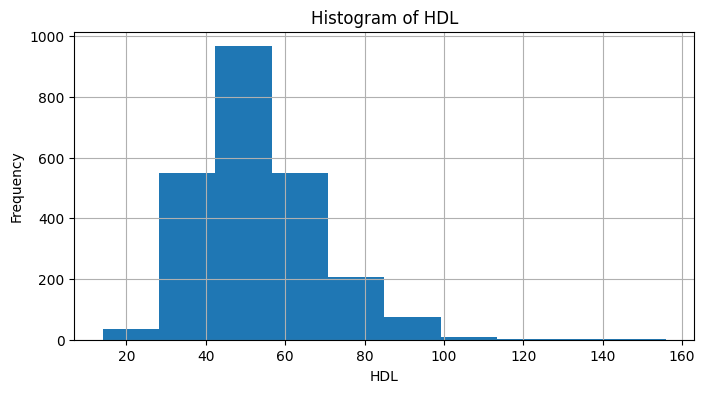

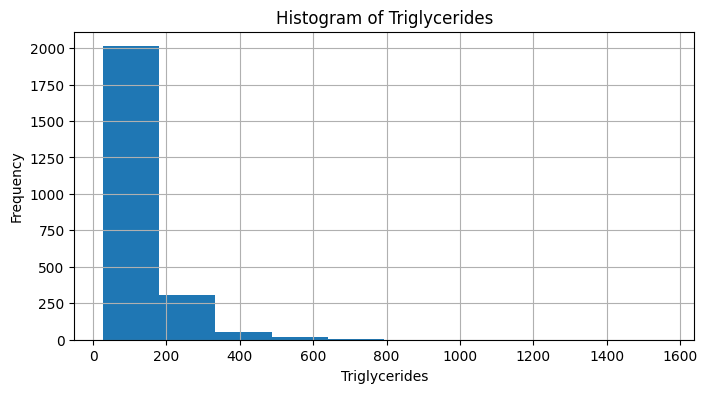

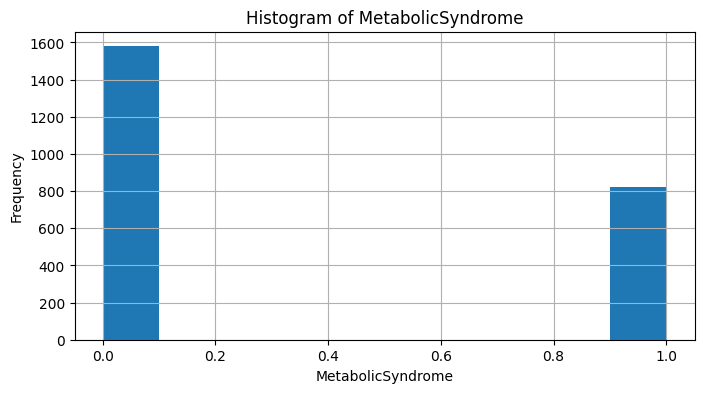

In [ ]:
num_cols = df.select_dtypes(include=[np.number]).columns.tolist()

for col in num_cols:
    plt.figure(figsize=(8, 4))
    df[col].hist()
    plt.title(f'Histogram of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

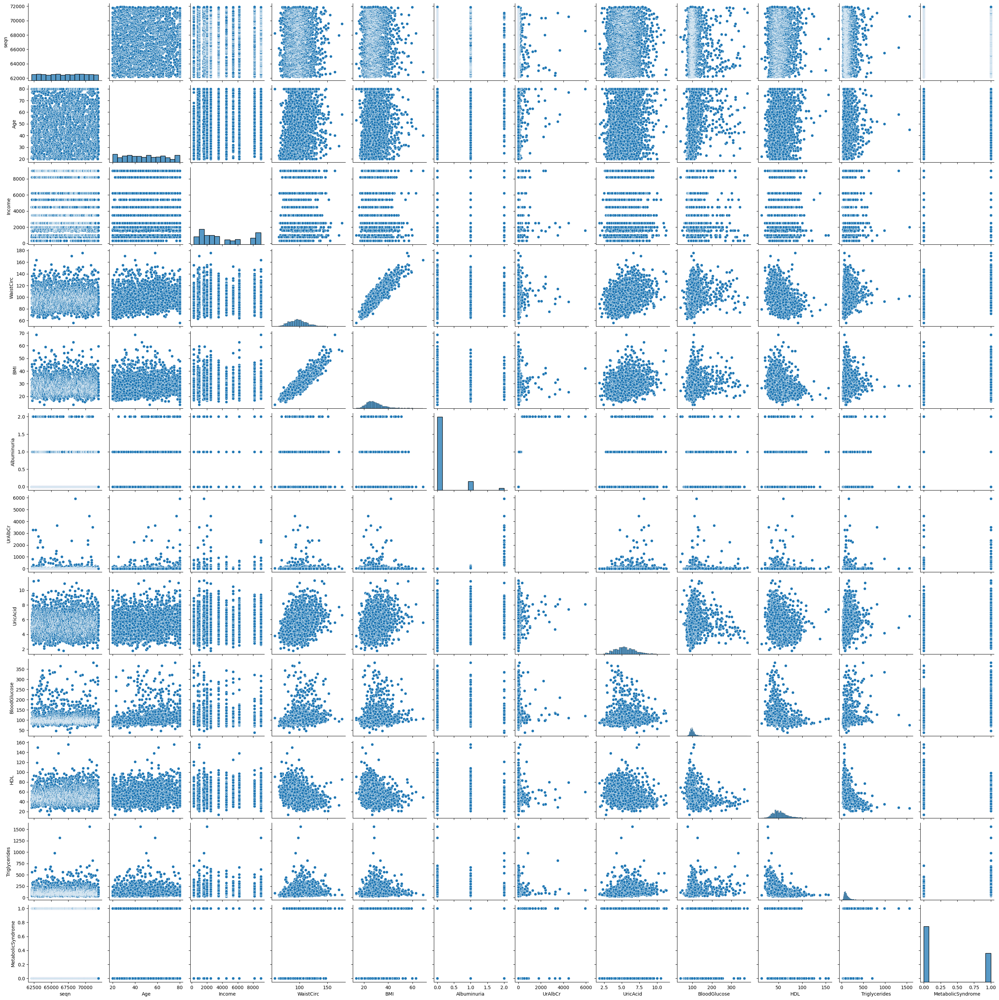

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

num_cols = df.select_dtypes(include=[np.number]).columns.tolist()

sns.pairplot(df[num_cols])
plt.show()

In [ ]:
stds = df[num_cols].std(numeric_only=True)
vars_ = df[num_cols].var(numeric_only=True)
iqr = df[num_cols].quantile(0.75) - df[num_cols].quantile(0.25)

dispersion = pd.DataFrame({"std": stds, "var": vars_, "IQR": iqr})
display(dispersion)

,std,var,IQR
seqn,2823.565114,7.972520e+06,4904.00
Age,17.632852,3.109175e+02,29.00
Income,2954.032186,8.726306e+06,4600.00
WaistCirc,16.252634,2.641481e+02,20.95
BMI,6.662242,4.438547e+01,8.10
Albuminuria,0.422780,1.787425e-01,0.00
UrAlbCr,258.272829,6.670485e+04,9.24
UricAcid,1.439358,2.071751e+00,1.90
BloodGlucose,34.820657,1.212478e+03,18.00
HDL,15.185537,2.306005e+02,19.00


<Figure size 1000x600 with 0 Axes>

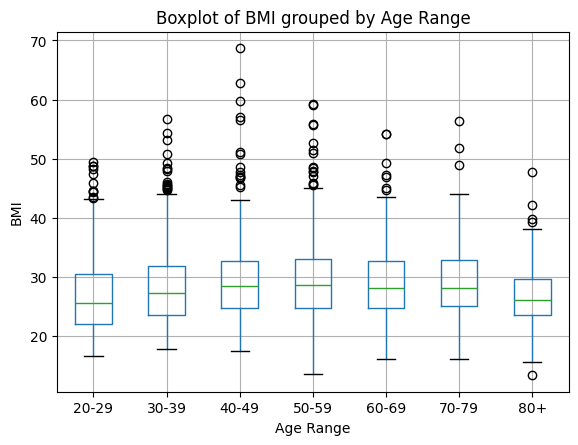

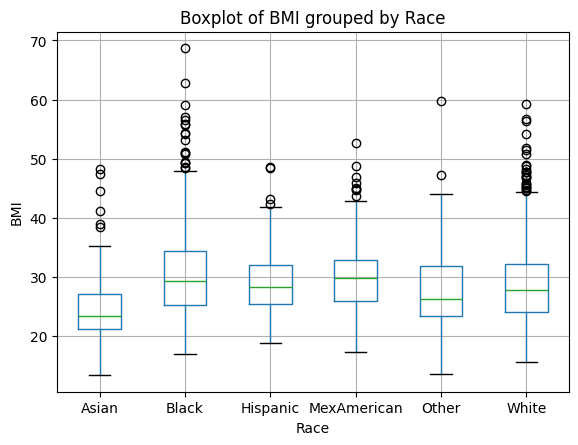

In [ ]:
# Create age ranges
age_bins = [20, 30, 40, 50, 60, 70, 80, 90]
age_labels = ['20-29', '30-39', '40-49', '50-59', '60-69', '70-79', '80+']
df['Age_Range'] = pd.cut(df['Age'], bins=age_bins, labels=age_labels, right=False)

# Boxplot of BMI grouped by Age Range
plt.figure(figsize=(10, 6))
df.boxplot(column='BMI', by='Age_Range')
plt.title('Boxplot of BMI grouped by Age Range')
plt.xlabel('Age Range')
plt.ylabel('BMI')
plt.suptitle('') # Suppress the default title
plt.show()

# Boxplot of BMI grouped by Race (already exists in the notebook)
df[["Race", "BMI"]].boxplot(by="Race")
plt.title('Boxplot of BMI grouped by Race')
plt.xlabel('Race')
plt.ylabel('BMI')
plt.suptitle('') # Suppress the default title
plt.show()

In [ ]:
corr = df.select_dtypes(include=[np.number]).corr()
display(corr)

,seqn,Age,Income,WaistCirc,BMI,Albuminuria,UrAlbCr,UricAcid,BloodGlucose,HDL,Triglycerides,MetabolicSyndrome
seqn,1.000000,0.009319,0.019393,-0.011310,-0.003498,-0.022789,-0.022108,0.022535,-0.039058,0.056168,0.019063,0.011364
Age,0.009319,1.000000,-0.011982,0.226470,0.079916,0.233464,0.118380,0.147928,0.236610,0.079368,0.069885,0.248618
Income,0.019393,-0.011982,1.000000,-0.063519,-0.081061,-0.100098,-0.048996,0.007967,-0.093311,0.077549,-0.039772,-0.083706
WaistCirc,-0.011310,0.226470,-0.063519,1.000000,0.908751,0.121825,0.047630,0.355836,0.261579,-0.352481,0.236098,0.497479
BMI,-0.003498,0.079916,-0.081061,0.908751,1.000000,0.077088,0.038740,0.272089,0.209645,-0.292905,0.163758,0.430825
Albuminuria,-0.022789,0.233464,-0.100098,0.121825,0.077088,1.000000,0.536214,0.176760,0.198642,-0.024188,0.107842,0.158501
UrAlbCr,-0.022108,0.118380,-0.048996,0.047630,0.038740,0.536214,1.000000,0.130928,0.106458,0.001667,0.077873,0.085168
UricAcid,0.022535,0.147928,0.007967,0.355836,0.272089,0.176760,0.130928,1.000000,0.055943,-0.252587,0.207328,0.246423
BloodGlucose,-0.039058,0.236610,-0.093311,0.261579,0.209645,0.198642,0.106458,0.055943,1.000000,-0.213905,0.269506,0.362219
HDL,0.056168,0.079368,0.077549,-0.352481,-0.292905,-0.024188,0.001667,-0.252587,-0.213905,1.000000,-0.388487,-0.371378


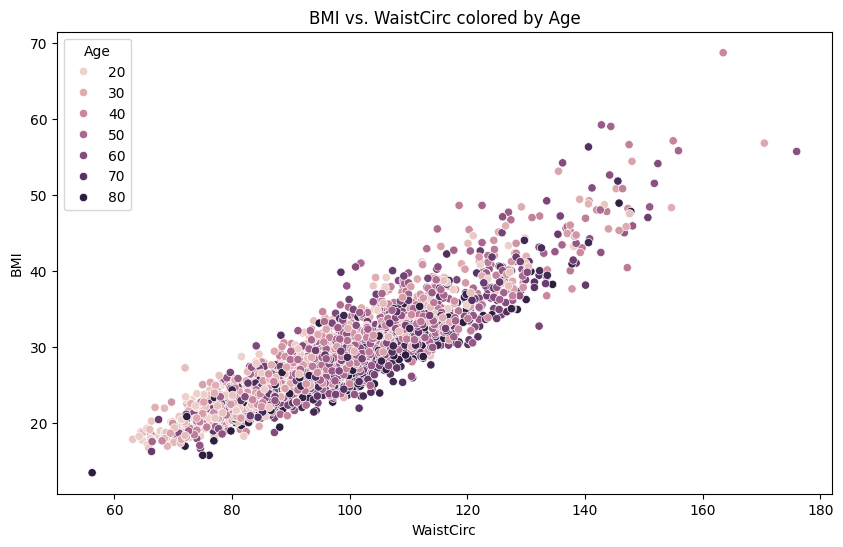

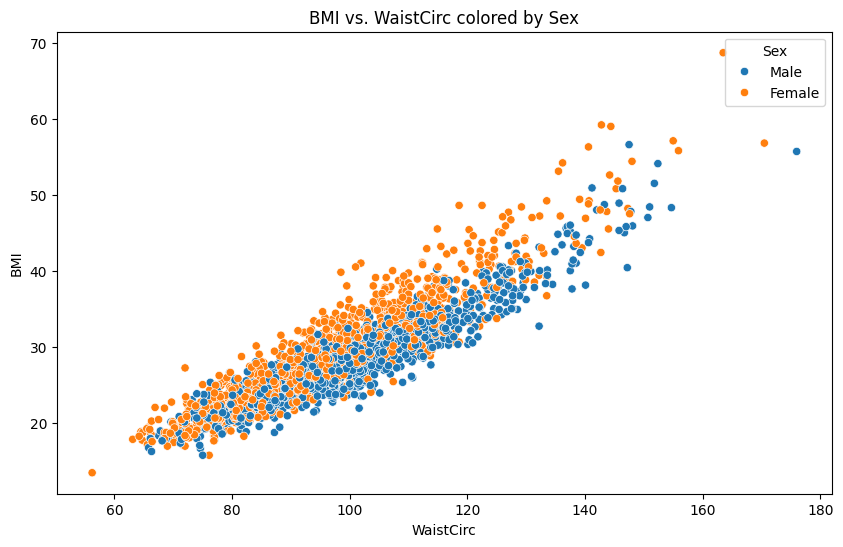

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Scatter plot of BMI vs. WaistCirc colored by Age
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='WaistCirc', y='BMI', hue='Age')
plt.title('BMI vs. WaistCirc colored by Age')
plt.xlabel('WaistCirc')
plt.ylabel('BMI')
plt.show()

# Scatter plot of BMI vs. WaistCirc colored by Sex
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='WaistCirc', y='BMI', hue='Sex')
plt.title('BMI vs. WaistCirc colored by Sex')
plt.xlabel('WaistCirc')
plt.ylabel('BMI')
plt.show()